In [1]:
import pandas as pd
import seaborn as sns
import re
import numpy as np
import matplotlib.pyplot as plt

In [2]:
id_season = {
        578: 2023,
        489: 2022,
        418: 2021,
        363: 2020,
        274: 2019,
        210: 2018,
        79: 2017,
        54: 2016,
        42: 2015,
        27: 2014,
        22: 2013,
        21: 2012,
        20: 2011,
        19: 2010,
        18: 2009,
        17: 2008,
        16: 2007,
        15: 2006,
        14: 2005,
        13: 2004,
        12: 2003,
        11: 2002,
        10: 2001,
        9: 2000,
        8: 1999,
        7: 1998,
        6: 1997,
        5: 1996,
        4: 1995,
        3: 1994,
        2: 1993,
        1: 1992}

In [3]:
path = '../../parsers/official/data/player_stat.csv'
df = pd.read_csv(path)
pd.set_option('display.max_columns', None)
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
0,578,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,23 years 303 days,Max Aarons,Max,James,Aarons,19970.0,119.0,10.0,3.0,3.0,92.0,2.0,12.0,208.0,1.0,64.0,9.0,4.0,10.0,6.0,104.0,43.0,1.0,4.0,1.0,1.0,1.0,1.0,66.0,54.0,0.0,6.0,4.0,1.0,8.0,1.0,5.0,3.0,6.0,3.0,37.0,54.0,6.0,11.0,2.0,38.0,6.0,9.0,123.0,9.0,18.0,15.0,3.0,2.0,22.0,4.0,1.0,4.0,74.0,41.0,21.0,6.0,9.0,794.0,3.0,1.0,3.0,272.0,5.0,4.0,7.0,81.0,1.0,19.0,2.0,113.0,113.0,4.0,33.0,17.0,16.0,17.0,52.0,200.0,4.0,11.0,4.0,151.0,26.0,11.0,13.0,8.0,8.0,78.0,1.0,137.0,11.0,32.0,2.0,280.0,1.0,1.0,2.0,1.0,20.0,2.0,76.0,479.0,7.0,9.0,9.0,22.0,0.0,1.0,8.0,2.0,12.0,1.0
1,418,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,23 years 303 days,Max Aarons,Max,James,Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0
2,274,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,23 years 303 days,Max Aarons,Max,James,Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.0,6.0,1

In [4]:
df.shape

(2391, 133)

In [5]:
#Удаляем колонки в которых информация дублируется либо информация бесполезна
df.drop(['nationalTeam_isoCode',
         'nationalTeam_demonym',
         'nationalTeam_country', 
         'birth_country_isoCode', 
         'birth_country_demonym',
         'birth_date_millis',
         'name_first',
         'name_middle',
         'name_last'
         ], axis=1, inplace=True)

In [6]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2391 entries, 0 to 2390
Data columns (total 124 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    season_id                       2391 non-null   int64  
 1    playerId                        2391 non-null   float64
 2    info_position                   2391 non-null   object 
 3    info_shirtNum                   2186 non-null   float64
 4    info_positionInfo               2391 non-null   object 
 5    info_loan                       2391 non-null   bool   
 6    birth_date_label                2391 non-null   object 
 7    birth_country_country           2391 non-null   object 
 8    birth_place                     1519 non-null   object 
 9    age                             2391 non-null   object 
 10   name_display                    2391 non-null   object 
 11   id                              2391 non-null   float64
 12   _accurate_back_zon

In [7]:
col = df.columns
for i in col:
    if df[i].dtypes == float:
        print(f'{i}: mean: {int(df[i].mean())}, min: {df[i].min()}, max: {df[i].max()}, na: {df[i].isna().sum()}')

playerId: mean: 253646, min: 6011.0, max: 352025.0, na: 0
info_shirtNum: mean: 16, min: 1.0, max: 98.0, na: 205
id: mean: 20966, min: 2100.0, max: 140364.0, na: 0
_accurate_back_zone_pass: mean: 271, min: 0.0, max: 2008.0, na: 67
_accurate_chipped_pass: mean: 29, min: 0.0, max: 252.0, na: 255
_accurate_cross: mean: 10, min: 0.0, max: 135.0, na: 902
_accurate_cross_nocorner: mean: 7, min: 0.0, max: 70.0, na: 931
_accurate_fwd_zone_pass: mean: 291, min: 0.0, max: 1707.0, na: 65
_accurate_launches: mean: 10, min: 0.0, max: 219.0, na: 837
_accurate_long_balls: mean: 45, min: 0.0, max: 410.0, na: 241
_accurate_pass: mean: 550, min: 0.0, max: 2903.0, na: 40
_accurate_through_ball: mean: 2, min: 0.0, max: 23.0, na: 1485
_accurate_throws: mean: 35, min: 0.0, max: 460.0, na: 686
_aerial_lost: mean: 26, min: 0.0, max: 245.0, na: 288
_aerial_won: mean: 25, min: 0.0, max: 240.0, na: 265
_appearances: mean: 19, min: 1.0, max: 38.0, na: 17
_attempted_tackle_foul: mean: 9, min: 0.0, max: 48.0, na: 41

In [8]:
df['season'] = df['season_id'].apply(lambda x: id_season[x])

In [9]:
#Возраст у игрока в каждом сезоне одинаковый, исправим это
df['age'] = df['season'] - df['birth_date_label'].apply(lambda x: int(x.split()[-1]))

In [10]:
df.shape

(2391, 125)

In [11]:
#Удалим строки с большим количеством пропусков
"""df.dropna(thresh=62, inplace=True)
df.shape"""

'df.dropna(thresh=62, inplace=True)\ndf.shape'

In [12]:
#Удалим колонки, в которых  более 30% пропусков
"""df.dropna(thresh=1700, axis=1, inplace=True)
df.shape"""

'df.dropna(thresh=1700, axis=1, inplace=True)\ndf.shape'

In [13]:
df.columns

Index(['season_id', 'playerId', 'info_position', 'info_shirtNum',
       'info_positionInfo', 'info_loan', 'birth_date_label',
       'birth_country_country', 'birth_place', 'age',
       ...
       '_turnover', '_unsuccessful_touch', '_was_fouled', '_winning_goal',
       '_wins', '_won_contest', '_won_corners', '_won_tackle', '_yellow_card',
       'season'],
      dtype='object', length=125)

In [14]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']] #appearances = wins + losses + draws

,_wins,_losses,_game_started,_draws,_appearances
0,1.0,6.0,9.0,3.0,10.0
1,4.0,24.0,32.0,6.0,34.0
2,4.0,26.0,36.0,6.0,36.0
3,5.0,11.0,24.0,8.0,24.0
4,NaN,NaN,NaN,1.0,1.0
...,...,...,...,...,...
2386,10.0,NaN,7.0,5.0,15.0
2387,6.0,NaN,9.0,3.0,9.0
2388,25.0,6.0,37.0,6.0,37.0
2389,22.0,11.0,32.0,3.0,36.0


In [15]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']].isna().sum()

_wins            218
_losses          204
_game_started    237
_draws           332
_appearances      17
dtype: int64

In [16]:
df_temp = df[['_wins', '_losses', '_draws', '_appearances']]
df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)
df_temp

/tmp/ipykernel_38580/807101919.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)


,_wins,_losses,_draws,_appearances,sum_
0,1.0,6.0,3.0,10.0,10.0
1,4.0,24.0,6.0,34.0,34.0
2,4.0,26.0,6.0,36.0,36.0
3,5.0,11.0,8.0,24.0,24.0
4,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...
2386,10.0,NaN,5.0,15.0,15.0
2387,6.0,NaN,3.0,9.0,9.0
2388,25.0,6.0,6.0,37.0,37.0
2389,22.0,11.0,3.0,36.0,36.0


In [17]:
#Проверим гипотезу, что наны в этих колонка - нули
df_temp[df_temp['_appearances'] != df_temp['sum_']]

,_wins,_losses,_draws,_appearances,sum_
23,NaN,NaN,NaN,NaN,0.0
106,8.0,17.0,4.0,30.0,29.0
137,8.0,7.0,8.0,24.0,23.0
254,5.0,3.0,2.0,11.0,10.0
303,NaN,NaN,NaN,NaN,0.0
381,NaN,NaN,NaN,NaN,0.0
387,10.0,17.0,4.0,32.0,31.0
467,NaN,NaN,NaN,NaN,0.0
500,NaN,NaN,NaN,NaN,0.0
778,5.0,15.0,7.0,28.0,27.0


В нескольких строках наша гипотезу не подтвердилась, но разница везде в 1 матч, видимо это ошибка в данных. Но самое главное нет ни одной строки с нанами, которые мы заменили на нули, поэтому смело меняем наны в этих колонках на нули

In [18]:
df[['_wins', '_losses', '_draws', '_appearances']] = df[['_wins', '_losses', '_draws', '_appearances']].fillna(0)

In [19]:
df['per_wins'] = df['_wins'] / df['_appearances']

In [20]:
df[['_wins', '_losses', '_draws', '_appearances']].loc[4]

_wins           0.0
_losses         0.0
_draws          1.0
_appearances    1.0
Name: 4, dtype: float64

In [21]:
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
0,578,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,23,Max Aarons,19970.0,119.0,10.0,3.0,3.0,92.0,2.0,12.0,208.0,1.0,64.0,9.0,4.0,10.0,6.0,104.0,43.0,1.0,4.0,1.0,1.0,1.0,1.0,66.0,54.0,0.0,6.0,4.0,1.0,8.0,1.0,5.0,3.0,6.0,3.0,37.0,54.0,6.0,11.0,2.0,38.0,6.0,9.0,123.0,9.0,18.0,15.0,3.0,2.0,22.0,4.0,1.0,4.0,74.0,41.0,21.0,6.0,9.0,794.0,3.0,1.0,3.0,272.0,5.0,4.0,7.0,81.0,1.0,19.0,2.0,113.0,113.0,4.0,33.0,17.0,16.0,17.0,52.0,200.0,4.0,11.0,4.0,151.0,26.0,11.0,13.0,8.0,8.0,78.0,1.0,137.0,11.0,32.0,2.0,280.0,1.0,1.0,2.0,1.0,20.0,2.0,76.0,479.0,7.0,9.0,9.0,22.0,0.0,1.0,8.0,2.0,12.0,1.0,2023,0.100000
1,418,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,21,Max Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0,2021,0.117647
2,274,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,19,Max Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.0,6.0,175.0,167.0,24.0,73.0,28.0,112.0,13.0,29.0,476.0,36.0,71.0,63.0,8.0,28.0,62.0,37.0,10.0,37.0,456.0,130.0,53.0,26.0,40.0,3240.0,7.0,13.0,10.0,1316.0,29.0,14.0,24.0,410.0,NaN,77.0,4.0,530.0,530.0,5.0,126.0,47.0,82.0,55.0,250.0,1035.0,17.0,NaN,23.0,694.0,78.0,73.0,99.0,73.0,73.0,331.0,3.0,718.0,93.0,153.0,3.0,1339.0,4.0,14.0,NaN,NaN,48.0,NaN,299.0,2275.0,45.0,54.0,

Теперь наша гипотеза, что все наны в датасете являются нулями. Для начала сгруппируем датасет по сезонам и посмотрим есть ли зависимость года от пропусков

In [22]:
df_gr = df.groupby(by='season_id').agg(['count', 'size'])
df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27              76   76            76   76            69   76   
42             101  101           101  101            92  101   
54             112  112           112  112           102  112   
79             153  153           153  153           138  153   
210            191  191           191  191           173  191   
274            248  248           248  248           225  248   
363            301  301           301  301           273  301   
418            340  340           340  340           314  340   
489            438  438           438  438           404  438   
578            431  431           431  431           396  431   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                       76   76        76   76               76   76   
42                      101  101       101  101              101  101   
54                      112  112       112  112              112  112   
79                      153  153       153  153              153  153   
210                     191  191       191  191              191  191   
274                     248  248       248  248              248  248   
363                     301  301       301  301              301  301   
418                     340  340       340  340              340  340   
489                     438  438       438  438              438  438   
578                     431  431       431  431              431  431   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                           76   76          47   76    76   76           76   
42                          101  101          67  101   101  101          101   
54                          112  112          77  112   112  112          112   
79                          153  153         102  153   153  153          153   
210                         191  191         123  191   191  191          191   
274                         248  248         157  248   248  248          248   
363                         301  301         192  301   301  301          301   
418                         340  340         221  340   340  340          340   
489                         438  438         275  438   438  438          438   
578                         431  431         258  431   431  431          431   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76    76   76                       69   76   
42         101   101  101                       91  101   
54         112   112  112                      111  112   
79         153   153  153                      151  153   
210        191   191  191                      185  191   
274        248   248  248                      246  248   
363        301   301  301                      292  301   
418        340   340  340                      332  340   
489        438   438  438                      427  438   
578        431   431  431                      420  431   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                            64   76              45   76   
42                            86  101              65  101   
54                           107  112              82  112   
79                  

In [23]:
#Не знаю как тут обойтись без цикла, в цикле считаем отношение размера признака от количества данных (1.0 - пропусков нет), записываем информацию в count
for i in range(0, df_gr.shape[1], 2):
    df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]

df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27             1.0   76           1.0   76      0.907895   76   
42             1.0  101           1.0  101      0.910891  101   
54             1.0  112           1.0  112      0.910714  112   
79             1.0  153           1.0  153      0.901961  153   
210            1.0  191           1.0  191      0.905759  191   
274            1.0  248           1.0  248      0.907258  248   
363            1.0  301           1.0  301      0.906977  301   
418            1.0  340           1.0  340      0.923529  340   
489            1.0  438           1.0  438      0.922374  438   
578            1.0  431           1.0  431      0.918794  431   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                      1.0   76       1.0   76              1.0   76   
42                      1.0  101       1.0  101              1.0  101   
54                      1.0  112       1.0  112              1.0  112   
79                      1.0  153       1.0  153              1.0  153   
210                     1.0  191       1.0  191              1.0  191   
274                     1.0  248       1.0  248              1.0  248   
363                     1.0  301       1.0  301              1.0  301   
418                     1.0  340       1.0  340              1.0  340   
489                     1.0  438       1.0  438              1.0  438   
578                     1.0  431       1.0  431              1.0  431   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                          1.0   76    0.618421   76   1.0   76          1.0   
42                          1.0  101    0.663366  101   1.0  101          1.0   
54                          1.0  112    0.687500  112   1.0  112          1.0   
79                          1.0  153    0.666667  153   1.0  153          1.0   
210                         1.0  191    0.643979  191   1.0  191          1.0   
274                         1.0  248    0.633065  248   1.0  248          1.0   
363                         1.0  301    0.637874  301   1.0  301          1.0   
418                         1.0  340    0.650000  340   1.0  340          1.0   
489                         1.0  438    0.627854  438   1.0  438          1.0   
578                         1.0  431    0.598608  431   1.0  431          1.0   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76   1.0   76                 0.907895   76   
42         101   1.0  101                 0.900990  101   
54         112   1.0  112                 0.991071  112   
79         153   1.0  153                 0.986928  153   
210        191   1.0  191                 0.968586  191   
274        248   1.0  248                 0.991935  248   
363        301   1.0  301                 0.970100  301   
418        340   1.0  340                 0.976471  340   
489        438   1.0  438                 0.974886  438   
578        431   1.0  431                 0.974478  431   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                      0.842105   76        0.592105   76   
42                      0.851485  101        0.643564  101   
54                      0.955357  112        0.732143  112   
79                  

Зависимости в в соотношении пропущеных значений по сезонам не выявлено, только в 3 колонках есть сильное различие :
_winning_goal
_attempts_obox
_times_tackled

In [24]:
(df['_winning_goal']==0).sum()

1353

In [25]:
df['_attempts_obox'].isna().sum()

839

In [26]:
df['_times_tackled'].isna().sum()

587

In [27]:
df[df['info_shirtNum'].isna()]

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
17,578,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,21,Naouirou Ahamada,68086.0,5.0,1.0,NaN,NaN,24.0,NaN,1.0,29.0,NaN,NaN,NaN,NaN,4.0,2.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0,NaN,NaN,0.0,NaN,2.0,NaN,2.0,1.0,NaN,1.0,5.0,5.0,NaN,NaN,NaN,1.0,NaN,2.0,9.0,NaN,2.0,2.0,NaN,NaN,1.0,1.0,NaN,1.0,10.0,3.0,3.0,3.0,NaN,56.0,NaN,NaN,NaN,35.0,NaN,NaN,4.0,10.0,NaN,3.0,1.0,12.0,12.0,NaN,3.0,4.0,4.0,10.0,12.0,28.0,0.0,1.0,NaN,7.0,1.0,NaN,3.0,3.0,3.0,16.0,NaN,32.0,NaN,1.0,NaN,36.0,NaN,NaN,NaN,4.0,2.0,NaN,NaN,49.0,NaN,1.0,1.0,1.0,0.0,0.0,2.0,NaN,2.0,NaN,2023,0.000000
18,489,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,20,Naouirou Ahamada,68086.0,16.0,NaN,NaN,NaN,21.0,1.0,1.0,37.0,NaN,NaN,1.0,NaN,8.0,1.0,8.0,4.0,NaN,1.0,1.0,NaN,NaN,2.0,8.0,8.0,NaN,NaN,2.0,0.0,2.0,NaN,2.0,NaN,1.0,3.0,7.0,4.0,NaN,NaN,NaN,4.0,NaN,2.0,11.0,NaN,2.0,2.0,NaN,NaN,4.0,NaN,NaN,NaN,19.0,5.0,3.0,5.0,NaN,87.0,NaN,0.0,1.0,43.0,NaN,1.0,5.0,8.0,NaN,1.0,1.0,17.0,17.0,NaN,4.0,4.0,2.0,6.0,10.0,36.0,2.0,2.0,1.0,18.0,NaN,NaN,2.0,2.0,2.0,11.0,1.0,28.0,1.0,2.0,2.0,44.0,NaN,3.0,NaN,8.0,3.0,NaN,NaN,66.0,4.0,5.0,5.0,NaN,0.0,0.0,1.0,1.0,2.0,1.0,2022,0.000000
49,578,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,25,Trent Alexander-Arnold,14732.0,166.0,31.0,11.0,3.0,190.0,2.0,30.0,345.0,2.0,44.0,2.0,0.0,8.0,2.0,48.0,30.0,10.0,5.0,1.0,6.0,10.0,5.0,59.0,51.0,1.0,1.0,2.0,6.0,9.0,1.0,7.0,6.0,3.0,2.0,22.0,23.0,1.0,14.0,2.0,86.0,0.0,3.0,184.0,7.0,6.0,5.0,1.0,2.0,9.0,6.0,NaN,6.0,141.0,94.0,55.0,1.0,6.0,601.0,3.0,4.0,7.0,407.0,NaN,NaN,21.0,93.0,NaN,58.0,NaN,130.0,130.0,2.0,24.0,25.0,4.0,44.0,79.0,331.0,2.0,8.0,11.0,181.0,75.0,14.0,13.0,31.0,19.0,136.0,NaN,278.0,19.0,84.0,NaN,428.0,1.0,12.0,4.0,1.0,12.0,7.0,55.0,593.0,8.0,6.0,6.0,3.0,0.0,5.0,8.0,9.0,9.0,3.0,2023,0.625000
50,489,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,24,Trent Alexander-Arnold,14732.0,803.0,178.0,79.0,47.0,1093.0,

In [28]:
df.describe()

,season_id,playerId,info_shirtNum,age,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
count,2391.000000,2391.000000,2186.000000,2391.000000,2391.000000,2324.000000,2136.000000,1489.000000,1460.000000,2326.000000,1554.000000,2150.000000,2351.000000,906.000000,1705.000000,2103.000000,2126.000000,2391.000000,1979.000000,2325.000000,2278.000000,1552.000000,1937.000000,1579.000000,1347.000000,1653.000000,1822.000000,2190.000000,2295.000000,1416.000000,1419.000000,2089.000000,1738.000000,2053.000000,1631.000000,1727.000000,1589.000000,1980.000000,2391.000000,2247.000000,2269.000000,1419.000000,2147.000000,1910.000000,2274.000000,1455.000000,2073.000000,2316.000000,2154.000000,2231.000000,2219.000000,1792.000000,1911.000000,2131.000000,1998.000000,1238.000000,1998.000000,2302.000000,2236.000000,2184.000000,2391.000000,1896.000000,2374.000000,1132.000000,1736.000000,1886.000000,2355.000000,1653.000000,1330.000000,2248.000000,2254.000000,389.000000,2174.000000,1563.000000,2338.000000,2338.000000,1773.000000,2225.000000,2096.000000,2139.000000,2302.000000,2295.000000,2350.000000,1996.000000,1804.000000,1973.000000,2331.000000,2209.000000,2147.000000,2024.000000,1855.000000,1846.000000,2329.000000,1671.000000,2345.000000,2010.000000,2214.000000,1262.000000,2355.000000,936.000000,1970.000000,1760.000000,1775.000000,2103.000000,1263.000000,1727.000000,2365.000000,1954.000000,2125.000000,2125.000000,2122.000000,1804.000000,2391.000000,1946.000000,1835.000000,2049.000000,1699.000000,2391.000000,2374.000000
mean,354.317859,253646.969051,16.809241,25.171476,20966.375993,271.217298,29.307584,10.449966,7.108219,291.965606,10.380309,45.432558,550.344109,2.345475,35.134311,26.028055,25.966134,19.631117,9.632137,127.091613,74.765584,9.827964,13.321115,8.902470,4.331849,10.076225,17.941273,112.927397,93.035294,3.668785,4.378436,25.276209,7.299770,14.916220,5.134887,17.257672,10.118943,17.322727,4.484734,79.052960,79.427060,4.378436,31.434094,18.259686,87.807828,5.437113,16.775205,241.917962,17.740019,22.162259,19.327174,3.658482,18.402930,53.868606,17.947447,3.168013,17.947447,175.350999,107.334526,60.79

Много пропусков в признаках, где низкие значения (низкое среднее, максимальное), т.е там где должно быть много нулей

<Axes: xlabel='age', ylabel='Count'>

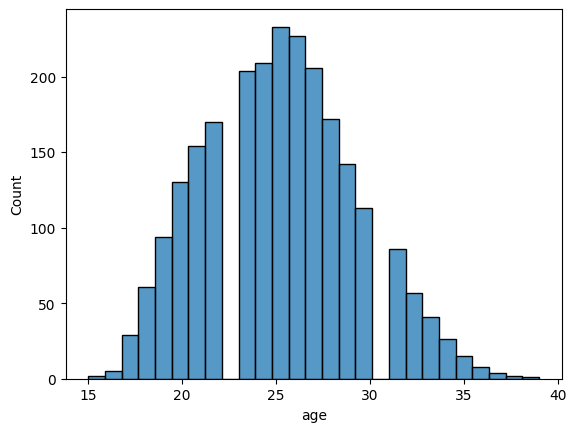

In [29]:
sns.histplot(df['age'])

<Axes: xlabel='info_position', ylabel='Count'>

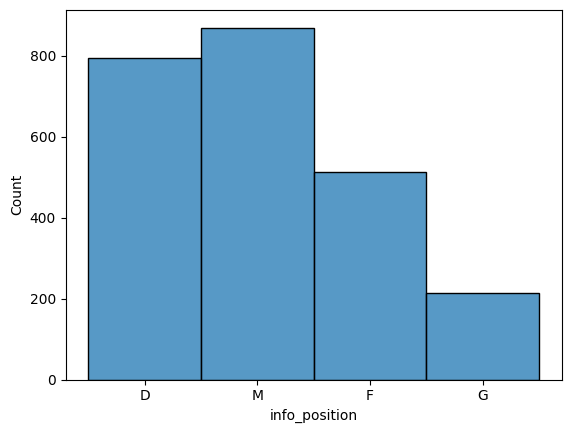

In [30]:
sns.histplot(df['info_position'])

In [31]:
#Топ 10 стран по количеству игроков в лиге
df.groupby(by='birth_country_country')['name_display'].count().sort_values(ascending=False).iloc[:10] 

birth_country_country
England        1014
France          166
Brazil          156
Spain            91
Portugal         84
Germany          64
Netherlands      63
Belgium          61
Ireland          56
Scotland         52
Name: name_display, dtype: int64

In [32]:
pd.set_option('display.max_rows', None)

In [33]:
df.iloc[:, 12:].corr()

,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
_accurate_back_zone_pass,1.000000,0.747451,0.144503,0.142369,0.631898,0.059228,0.577298,0.912139,0.051369,0.164118,0.222502,0.511825,0.601045,0.373702,0.588024,0.530805,0.135696,0.120979,-0.085473,0.137057,0.132398,-0.098611,0.403788,0.677202,0.027583,0.147344,0.283777,-0.014843,0.331335,0.646979,0.097338,0.162527,-0.047827,0.450526,0.219751,0.495198,0.147344,0.667868,0.595789,0.708205,-0.105807,0.380236,0.828525,0.653804,0.547578,0.545210,0.282178,0.593228,0.666809,0.627137,0.455866,0.627137,0.831062,0.666176,0.842832,0.356057,0.557913,0.688097,0.648775,0.106119,0.101784,0.890750,0.615672,-0.089290,0.484067,0.480936,0.184443,0.200197,0.292314,0.455031,0.454983,0.066247,0.787578,0.607056,0.295496,0.819308,0.416068,0.900371,0.309608,-0.012134,0.124892,0.998234,0.748802,0.663466,-0.032068,0.130302,0.127806,0.461905,-0.130895,0.626383,0.220560,0.473690,-0.206285,0.900598,0.034706,0.044279,-0.091942,-0.171631,0.517898,0.095466,0.157681,0.825695,-0.006723,-0.011341,-0.011341,0.146441,0.017363,0.567100,0.005387,-0.012214,0.480135,0.388813,-0.135530,0.143118
_accurate_chipped_pass,0.747451,1.000000,0.394157,0.342846,0.624029,0.090395,0.687553,0.765255,0.271731,0.190704,0.138266,0.312504,0.568126,0.426386,0.570740,0.521431,0.399160,0.304952,0.039877,0.386418,0.397271,0.076334,0.400685,0.691592,0.259585,0.165427,0.362318,0.186075,0.461689,0.563293,0.206592,0.406466,0.045067,0.426262,0.225043,0.403956,0.165427,0.442708,0.364974,0.792052,-0.021090,0.377188,0.757760,0.638783,0.536773,0.534476,0.304328,0.363417,0.497488,0.543564,0.318381,0.543564,0.693623,0.631461,0.714573,0.338189,0.429635,0.652535,0.359238,0.370200,0.322296,0.760471,0.431861,-0.022343,0.474247,0.486189,0.072403,0.433657,0.267152,0.558801,0.559184,0.272578,0.656903,0.624592,0.365698,0.662855,0.495506,0.739817,0.381851,0.009131,0.348445,0.756349,0.969815,0.439814,0.056384,0.373517,0.330998,0.568338,-0.069662,0.671085,0.238444,0.565616,-0.148680,0.791567,0.030485,0.201829,0.006687,-0.189942,0.492549,0.323590,0.185252,0.756765,0.037721,0.053528,0.053528,0.172471,0.037527,0.497179,0.09

/home/chewye/Documents/hse_movs/proj_new/annual-project/.venv/lib/python3.10/site-packages/seaborn/axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


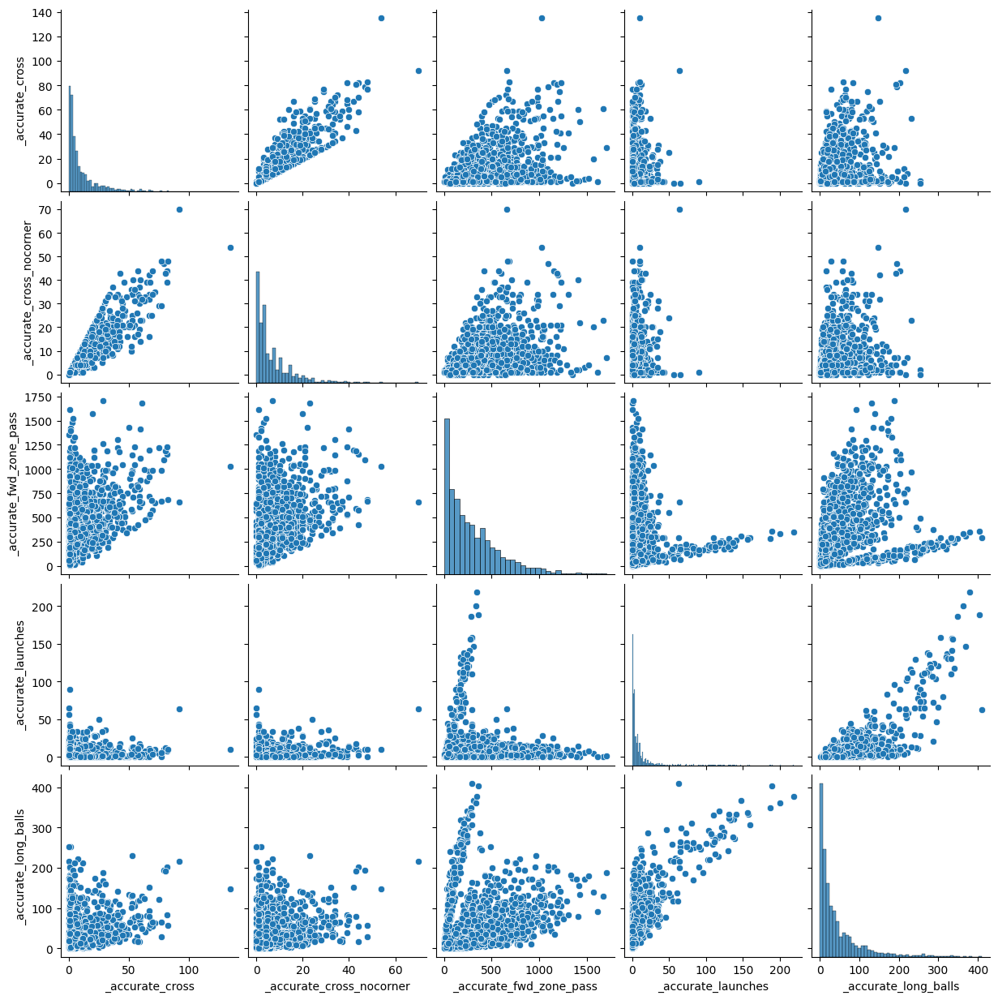

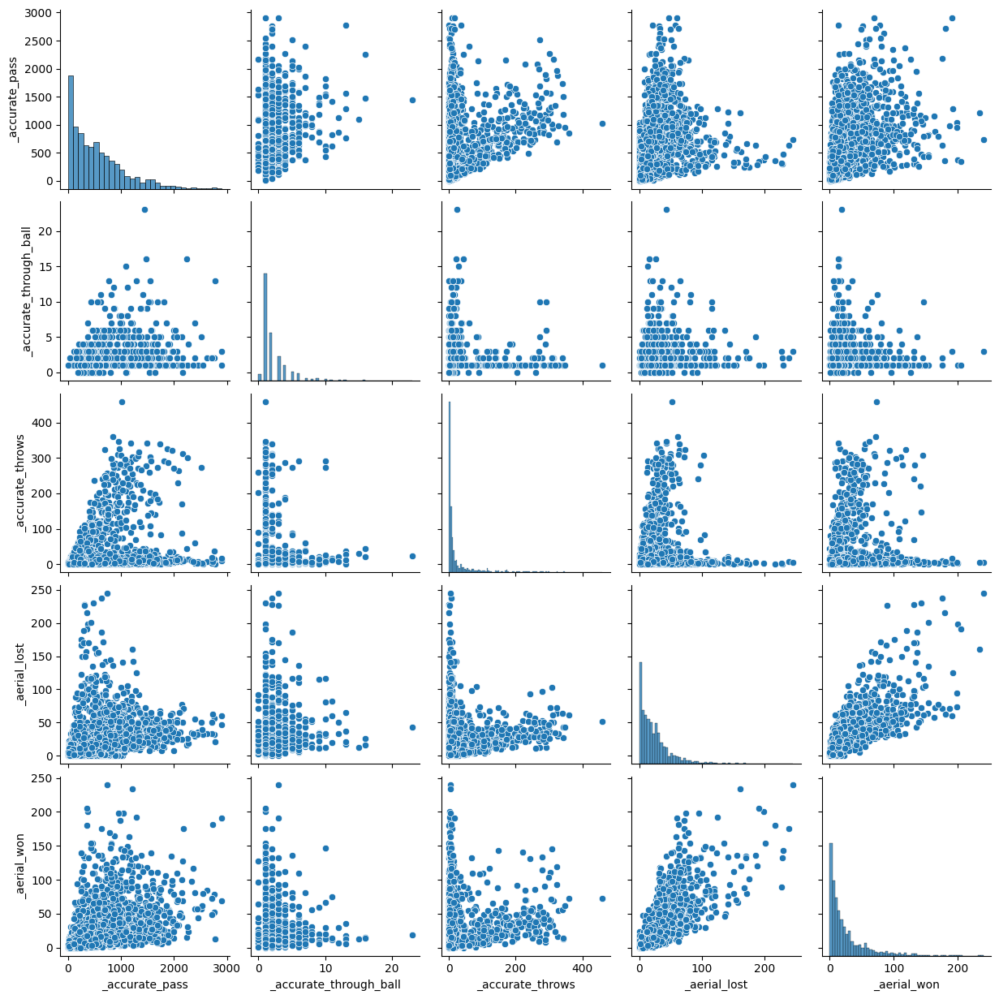

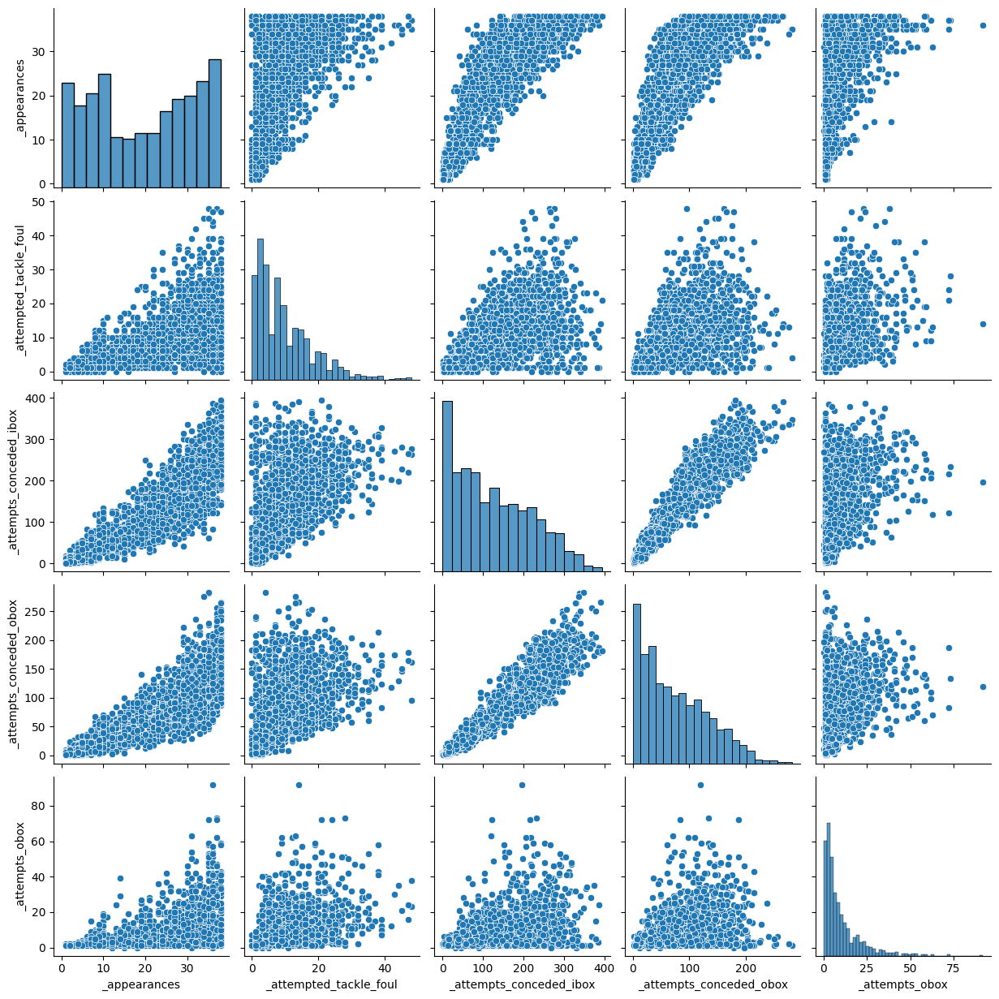

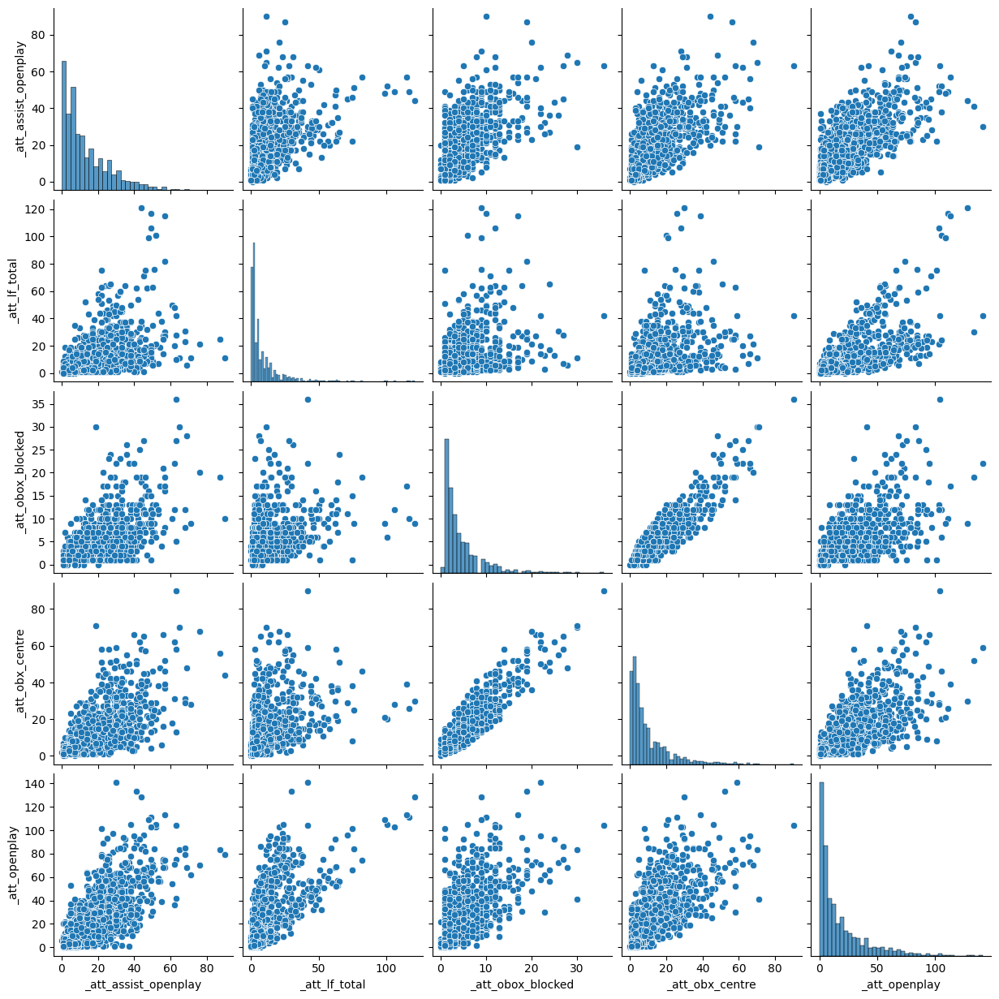

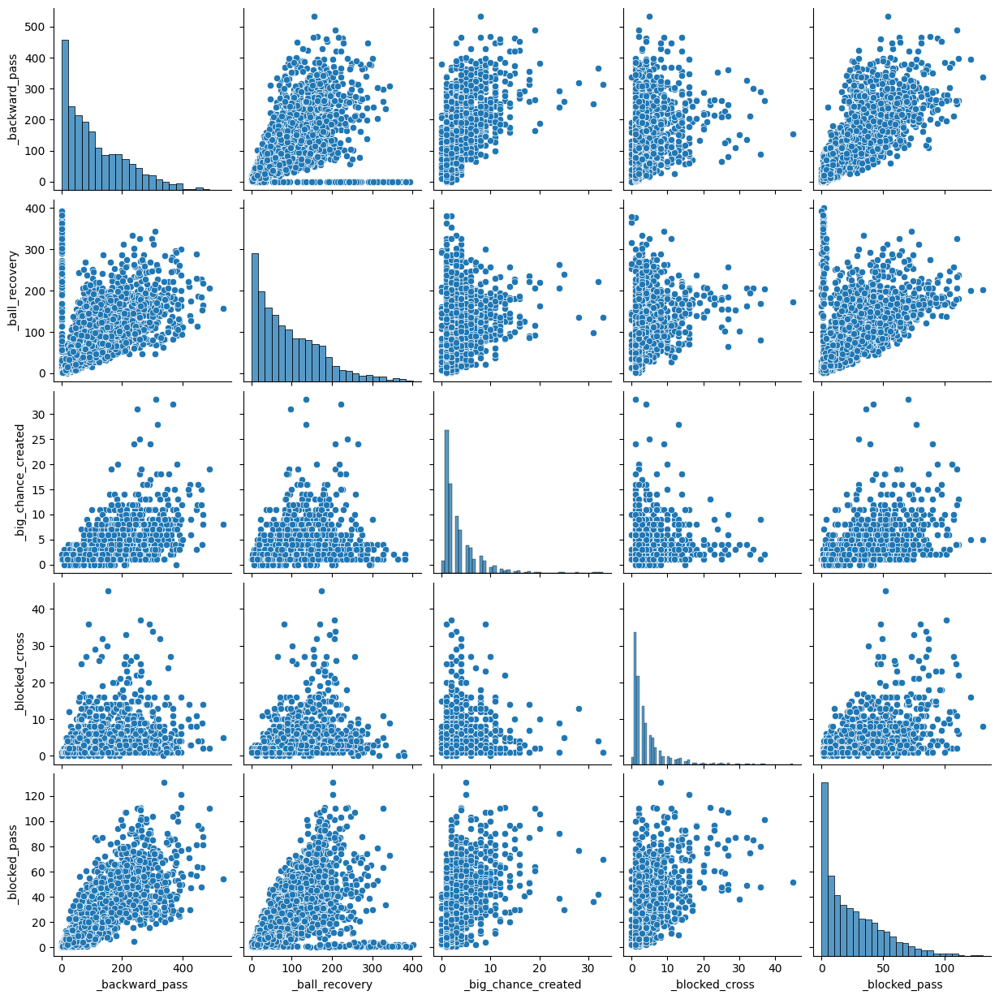

...

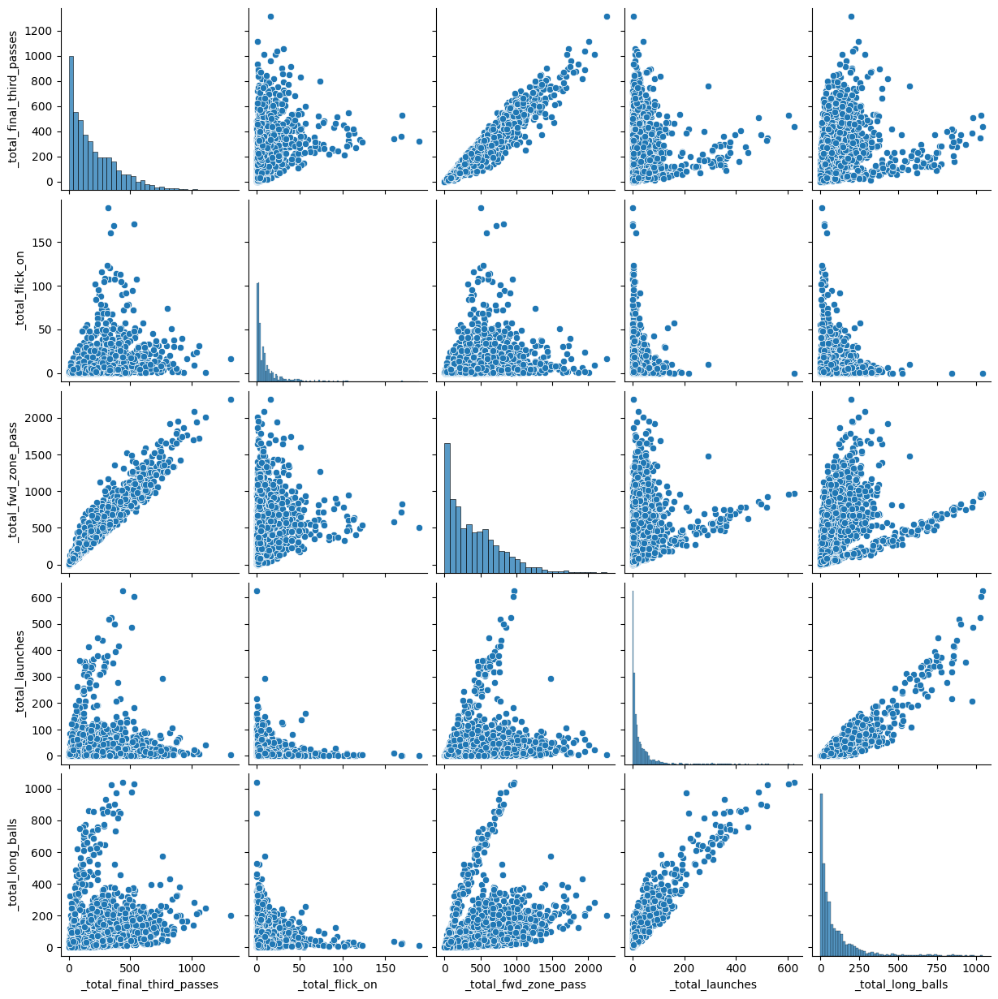

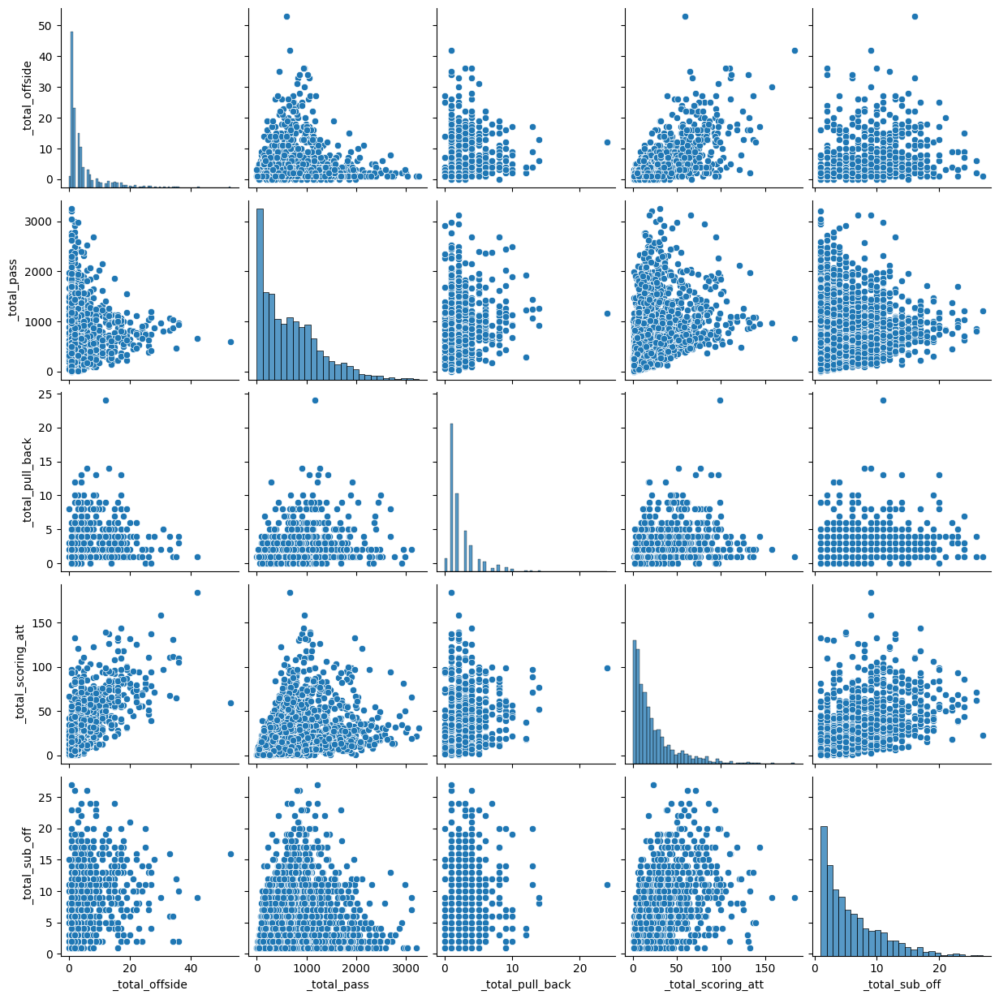

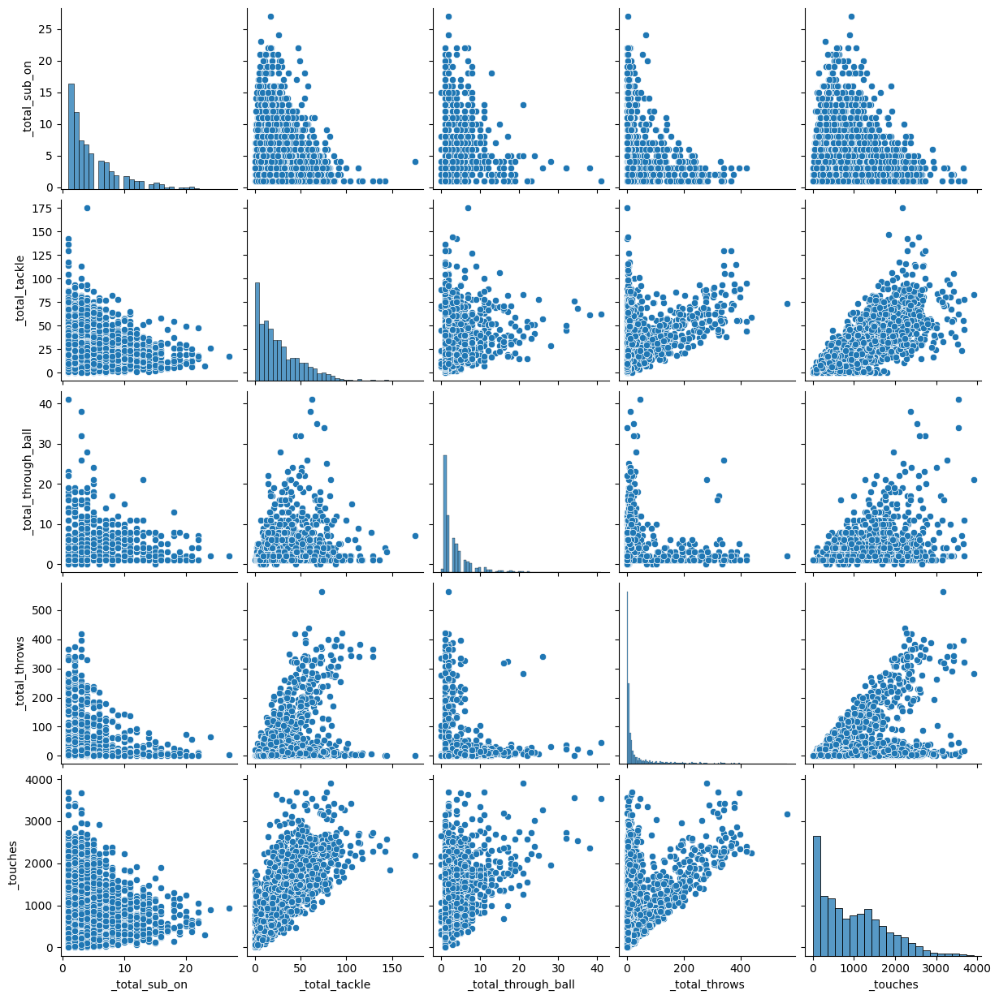

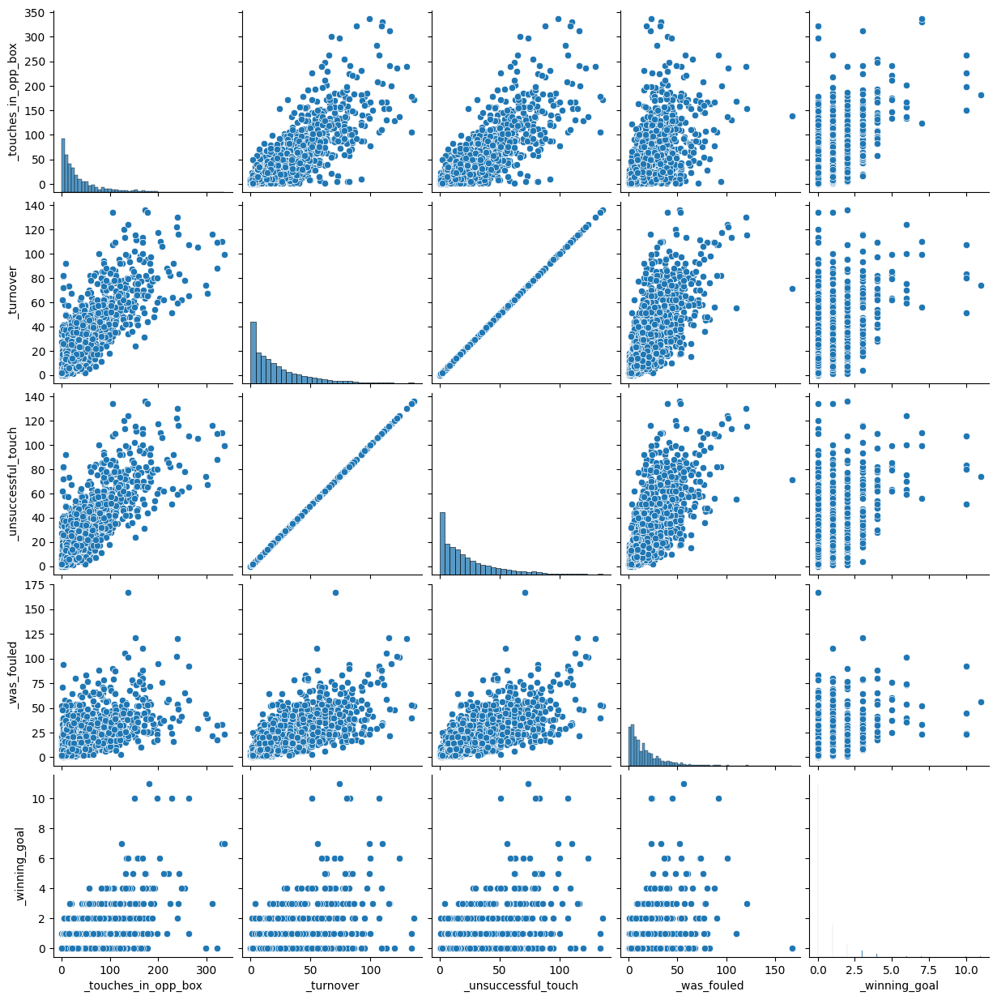

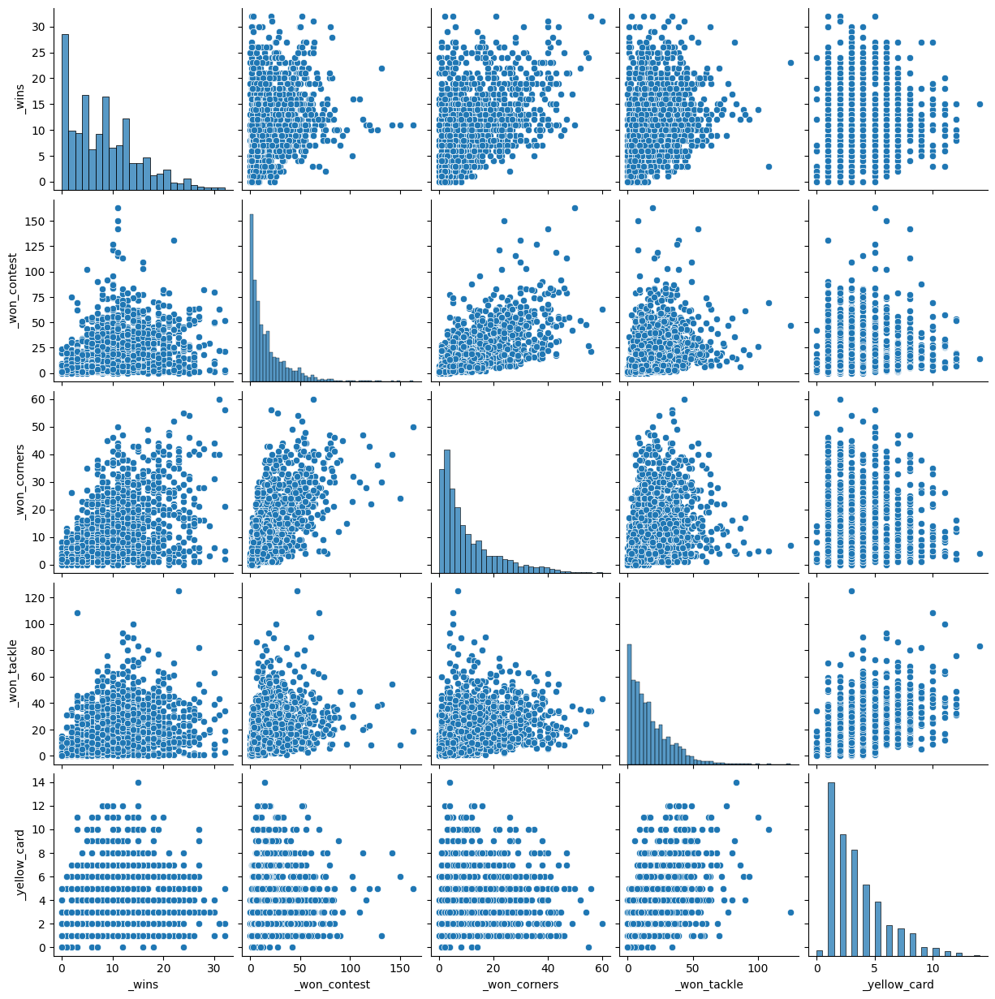

In [34]:
n = 5
df_new = df.iloc[:, 12:]
for col in range(2, df_new.shape[1]-n, n):
    loc_ =  list(range(col , col+n)) #Индексы колонок
    sns.pairplot(df_new.iloc[:, loc_])

In [35]:
df.to_csv('eda_data/players_stat.csv', index=False)